## Rotation

In [122]:
# system stuff
import os
import sys
sys.path.append(os.path.join(".."))

# Image processing
import cv2
import numpy as np
import matplotlib as mpl

# display utils
from utils.imutils import jimshow
#from utils.imutils import jimshow_channel
import matplotlib.pyplot as plt


__Load images__

In [11]:
image = cv2.imread(os.path.join("..", "data", "img", "trex.png"))

In [12]:
image.shape

(228, 350, 3)

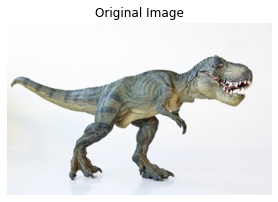

In [13]:
jimshow(image, "Original Image")

__Challenge 1: Where is the center__

In [22]:
# define the height and width as variables
height, width = image.shape[:2]

In [46]:
center_height = height/2 
center_width = width/2
print(center_height, center_width)

# Another way to do it
center = (width//2,height//2) # // will create them as an integer. Opencv will do this automatically
# I need to define width and height the other way around because that's how the function rotating wants it.
print(center)

114.0 175.0
(175, 114)


__Create rotation matrix__

In [47]:
M = cv2.getRotationMatrix2D(center, 45, 1)
# theta = degrees of rotation

In [48]:
# look at transformation matrix from last week
rotated = cv2.warpAffine(image, M, (width, height))


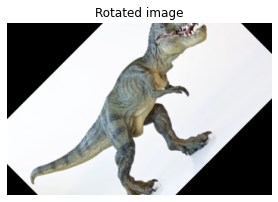

In [49]:
jimshow(rotated, "Rotated image")

In [50]:
print(M)

[[  0.70710678   0.70710678 -29.35385976]
 [ -0.70710678   0.70710678 157.13351365]]


__Create rotate function__

In [54]:
# Bundle up the code in a function
def imrotate(image, angle, center = None, scale = 1):
    
    # define the height and width as variables
    height, width = image.shape[:2]
    
    # find the center of the image
    if center is None:
        center = (width//2,height//2)
    
    # create rotation image
    M = cv2.getRotationMatrix2D(center, angle, scale)
    
    # created rotated image obejct
    rotated = cv2.warpAffine(image, M, (width, height))
    
    # return it
    return(rotated)

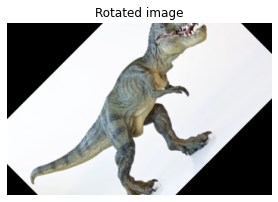

In [57]:
# Try the function
rotated_image = imrotate(image, 45)
jimshow(rotated_image, "Rotated image")

## Splitting channels

In [61]:
# import image
image = cv2.imread(os.path.join("..", "data", "img", "terasse.jpeg"))

In [62]:
image.shape

(1576, 1200, 3)

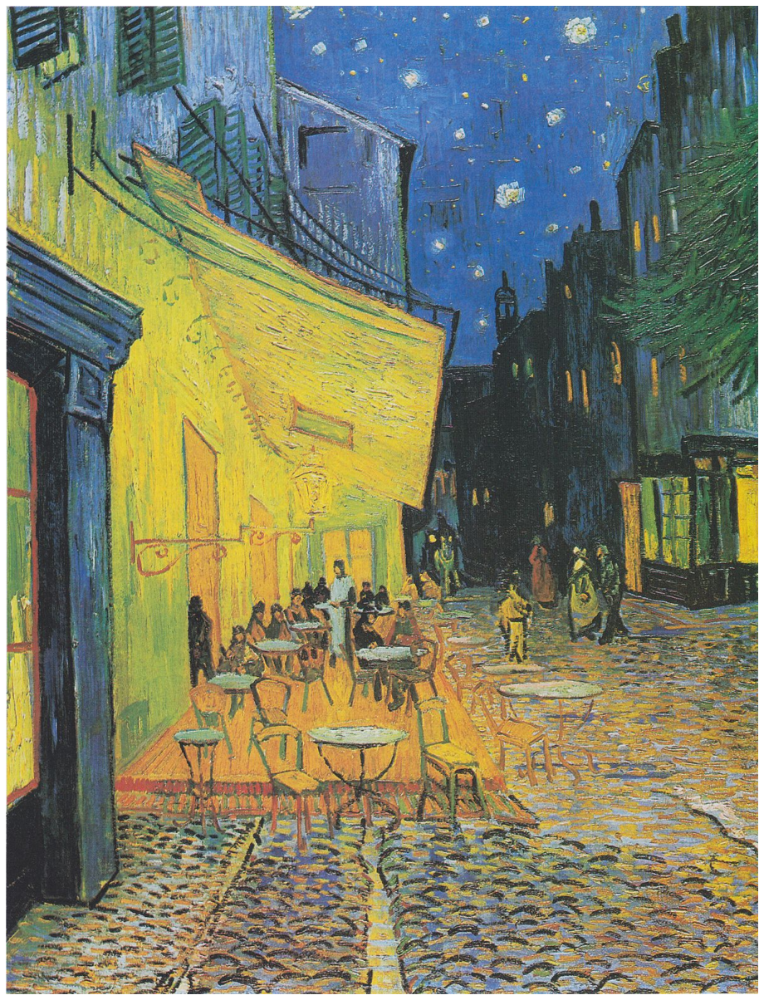

In [63]:
jimshow(image)

__splitting colors__

In [65]:
(blue, green, red) = cv2.split(image)

In [76]:
def jimshow_channel(image, title=False):
    """
    Modified jimshow() to plot individual channels
    """
    # Acquire default dots per inch value of matplotlib
    dpi = mpl.rcParams['figure.dpi']
    height, width = image.shape
    figsize = width / float(dpi), height / float(dpi)
    plt.figure(figsize=figsize)
    plt.imshow(image, cmap='gray')
    if title:
        plt.title(title)
    plt.axis('off')
    plt.show()

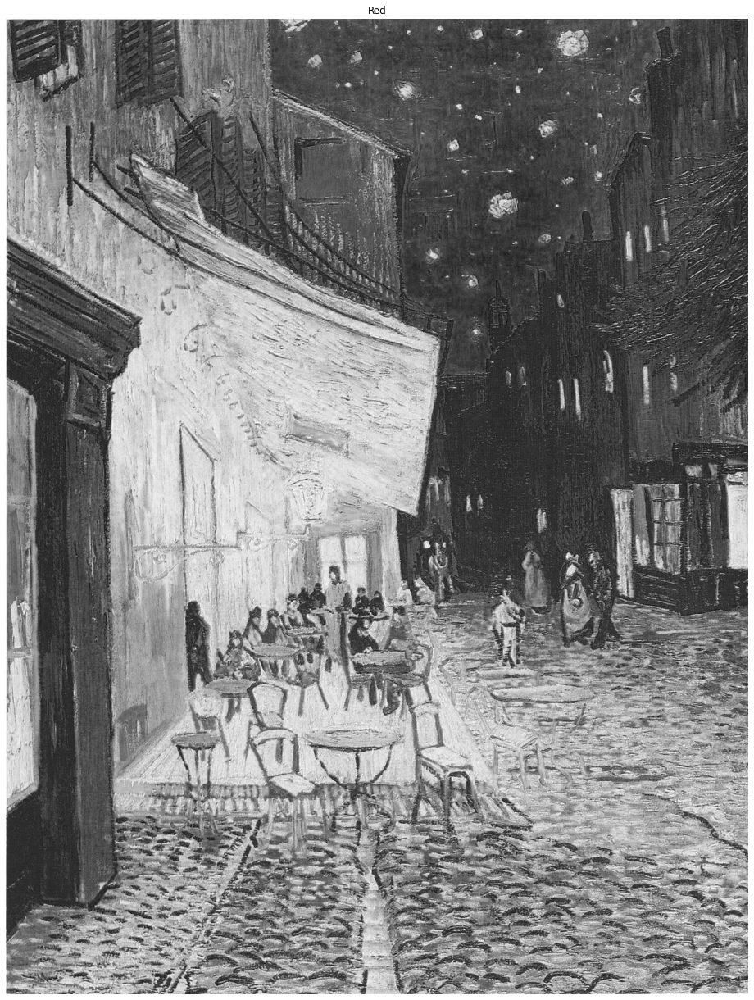

In [81]:
jimshow_channel(red, "Red")

__Define empty numpy array__

In [82]:
image.shape

(1576, 1200, 3)

__Create empty array the size of the original image__

In [85]:
# Create empty array with all zeros - define the properties
empty_array = np.zeros(image.shape[:2], dtype = "uint8")
# default is floating point numbers 
# we overwrite with "uint8" meaning integer positive values (and we get array of integers) 
empty_array

array([[0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       ...,
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0]], dtype=uint8)

In [92]:
# take a list as 
red_image = cv2.merge([empty_array, empty_array, red])

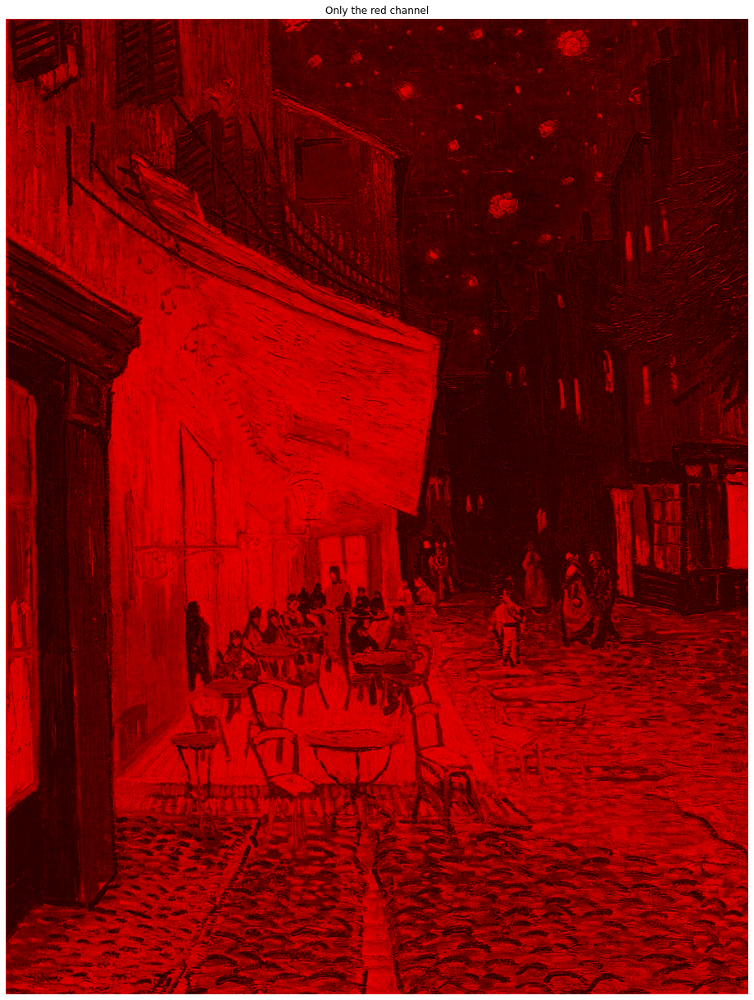

In [93]:
jimshow(red_image, "Only the red channel")
# We see the same as before, but instead seing intensity with black/white, we actually see the color.

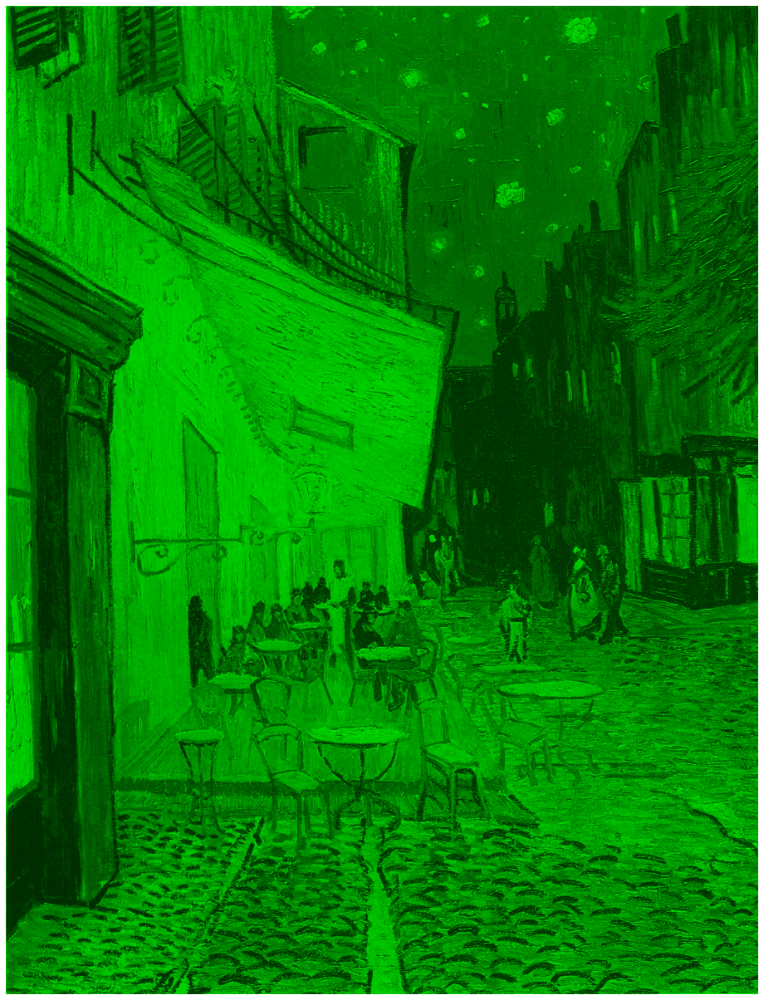

In [95]:
# Green
green_image = cv2.merge([empty_array, green, empty_array])
jimshow(green_image)

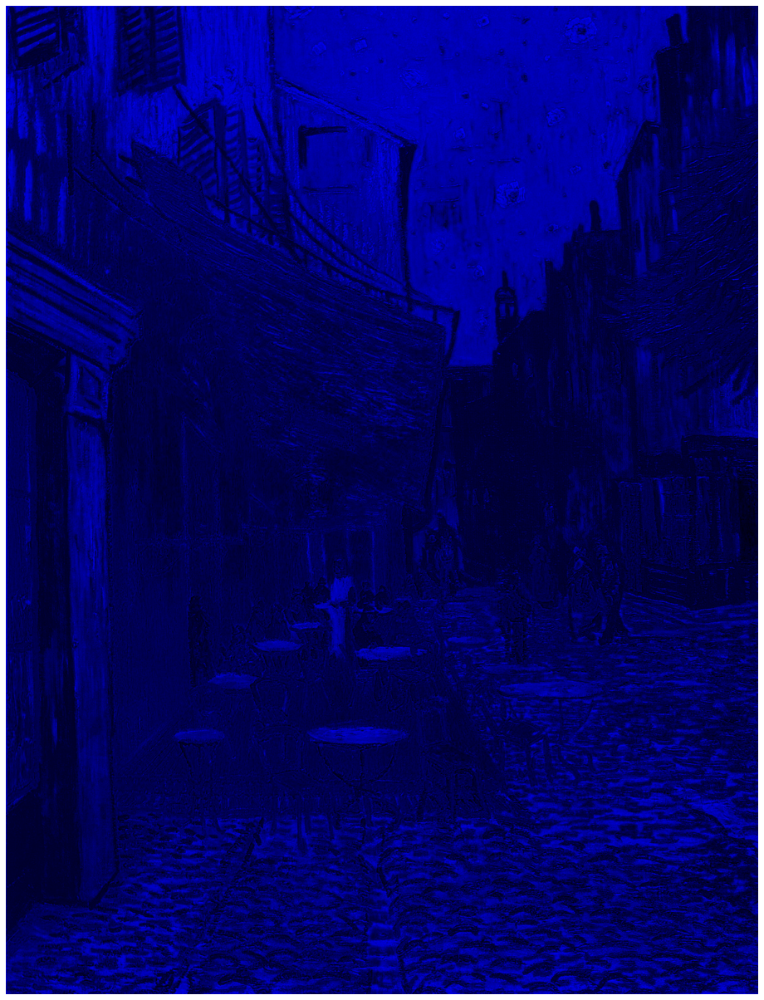

In [97]:
# Blue
blue_image = cv2.merge([blue, empty_array, empty_array])
jimshow(blue_image)

The people almost disappear. But the sky becomes way more prominent
- by seperating in different color channels, it can become easier to see patterns (face recognition etc.)


## Histograms

- By seperating the channels with the split function, we can plot the histograms of the intensity of the different colour channels

__Grey scale histogram__

In [99]:
# create figue 
plt.figure()

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

In [ ]:
# plt.hist(array, number of bins,range of possible values (256 does not count)) 

In [109]:
image.shape[0] * image.shape[1] * 3
# now we have a range of numbers in one dimension going from 0 to 255

5673600

In [114]:
# exactly the same as above
grey_image = image.flatten()

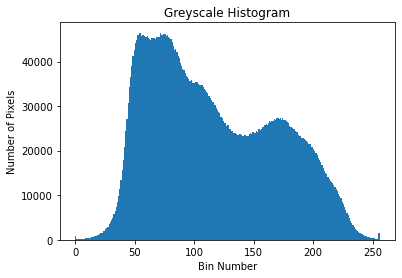

In [120]:
plt.figure()
plt.hist(grey_image, 256, [0,256])
plt.title("Greyscale Histogram")
plt.xlabel("Bin Number")
plt.ylabel("Number of Pixels")
plt.show()

- Kind of a dark image
- High frequency of low intensity pixels

## Studying multiple images

In [141]:
def plot_greycale(input_image, image_name):
    # initialise figure
    plt.figure()
    plt.hist(input_image.flatten(), 256, [0,256])
    plt.title(f"{image_name}")
    plt.xlabel("Bin Number")
    plt.ylabel("Number of Pixels")
    plt.show()

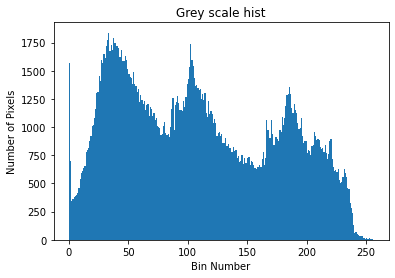

In [142]:
plot_greycale(image, "Grey scale hist")

..\data\img
<generator object Path.glob at 0x0000022E16B90B30>


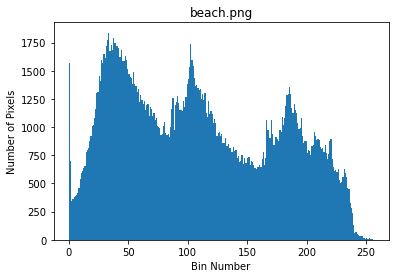

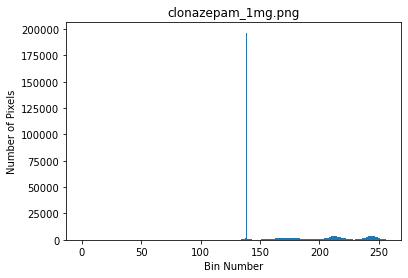

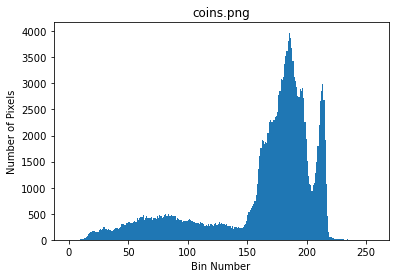

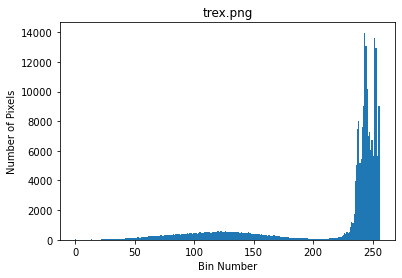

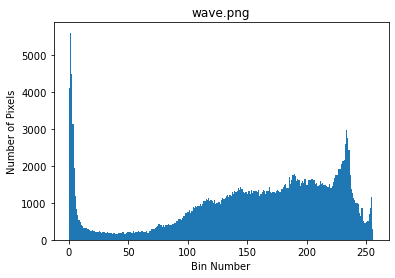

In [147]:
# import pathlib
from pathlib import Path

# point to image directory
image_dir = os.path.join("..", "data", "img")
print(image_dir)

# Iterate over files 
for image in Path(image_dir).glob("*.png"):
    
    # need the directory as a string
    image_path = str(image)
        
    # create it as an image
    image = cv2.imread(image_path)
    
    # image name
    _, image_name = os.path.split(image_path)
    
    plot_greycale(image, image_name)